<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Семенов Владислав Юрьевич, vliusemenov@edu.hse.ru

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

`Ответ: сид фиксируем для воспроизводимости экспериментов (чтобы при различных запусках ноутбука получались одни и те же результаты).`

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [ ]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [ ]:
!pip install ydata-profiling

__Выведем пропуски по колонкам для трейна и теста.__

In [ ]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [ ]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


__Выведем количество полных дубликатов для трейна и теста.__

In [ ]:
df_train.duplicated().sum()

985

In [ ]:
df_test.duplicated().sum()

62

__Построим дашборды.__

In [ ]:
from ydata_profiling import ProfileReport

ProfileReport(df_train, title="Train profiling").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
ProfileReport(df_test, title="Test profiling").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

__Ответ: толкования смысла столбцов я не нашел, поэтому решил сделать выводы самостоятельно:__

__а) name - модель автомобиля;__

__б) year - год выпуска автомобиля;__

__в) selling_pric - цена;__

__г) km_driven - пробег;__

__д) fuel - тип топлива (бензин, дизтопливо и т.д.);__

__е) seller_type - тип продавца (индивидуальный продавец, дилер и т.д.);__

__ж) transmission - тип трансмиссии;__

__з) owner - количество предыдущих владельцев автомобиля__

__и) mileage - расход топлива в км/л и км/кг;__

__к) engine - объем двигателя в куб. см.;__

__л) max_power - мощность двигателя в лошадиных силах;__

__м) torque - крутящий момент (преимущественно указан в формате "nm/kgm @ rpm", где nm/kgm - собственно крутящий момент (вероятно, максимальный) в Нм или кгм, rpm - количество оборотов в минуту, для которых достигался данный крутящий момент);__

__н) seats - количество мест в автомобиле.__

__Теперь немного выводов по пропускам и дубликатам:__

__- в тренировочной выборке наблюдается большое количество дубликатов (около 7 процентов от общего количества объектов). При этом некоторые строки повторяются до 30 раз: возможно, столько точное совпадение в технических и ценовых показателях говорит о том, что на одну машину опубликовано несколько объявлений на различных площадках, откуда парсились данные (но это всего лишь догадка). В тестовой выборке дубликатов поменьше (около 3 процентов).__

__- также заметно относительно малое количество пропусков (около 2 процентов для трейна и теста), причем количество пропусков для столбцов примерно равно между собой. Корреляционная матрица пропусков в дашборде показывает очень явную зависимость (значение около 1) для столбцов, отображающих технические характеристики автомобиля (mileage, engine, max_power, torque, seats). Видимо, на неокторые автомобили не указаны их технические характеристики.__

__- для некоторых столбцов (mileage, torque) величины указаны в разных единицах измерения, причем для одних автомобилей приводится одновременно несколько значений (например, в torque крутящий момент зачастую указан сразу в об/мин и в Нм), а для некоторых - нет.__

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [ ]:
train_num_stats = df_train.describe(include=np.number)
train_num_stats

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [ ]:
test_num_stats = df_test.describe(include=np.number)
test_num_stats

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [ ]:
df_train.describe(include=object)

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [ ]:
df_test.describe(include=object)

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [ ]:
train_num_stats.loc[['mean', '50%']] - test_num_stats.loc[['mean', '50%']]

,year,selling_price,km_driven,seats
mean,0.137403,21614.155171,-1808.725483,0.008203
50%,1.000000,15001.000000,-1500.000000,0.000000


__Таким образом, отличия по среднему и медиане незначительны (менее 10 процентов), что говорит о том, что распределения в трейне и тесте не смещены относительно друг друга. В то же время по имеющимся статистикам можно предположить, что тестовая выборка содержит данные по более новым автомобилям: год (средний и медианный) в трейне больше, чем в тесте, в то время как показатели km_driven и selling_price меньше (что пробег тем меньше, а цена тем больше, чем новее машина; корреляция между пробегом, ценой и годом также видна в дашборде).__

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [ ]:
y = df_train['selling_price']
X = df_train.drop('selling_price', axis=1)
X.duplicated().sum()

1159

__Выведем часть дубликатов на экран.__

In [ ]:
X[X.duplicated()].head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0


In [ ]:
df_train = pd.merge(X.drop_duplicates(), y, left_index=True, right_index=True)
df_train = df_train.reset_index(drop=True)

In [ ]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

__На самом деле столбец mileage содержит значения в 2 единицах измерения: в kmpl для бензина, дизтоплива и km/kg для сжиженного газа (LPG, CNG). Кажется, более простой вариант - перевести kmpl в km/kg для бензина и дизтоплива. Хотя плотность зависит от марки топлива и температуры, можно взять средние значения, воспользовавшись таблицей [отсюда](https://9171517.ru/plotnost/). Получим среднее значение для бензина 0,735 кг/л, для дизтоплива - 0.825 кг/л.__

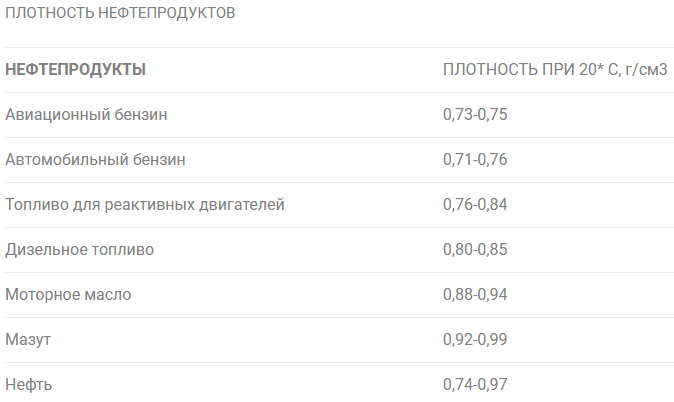

__А для engine и max_power просто удалим единицы измерения.__

In [ ]:
import re

fuel_density = {'Petrol': 0.735, 'Diesel': 0.825}

def remove_units(x):
    matching = re.match('\d{1,}\.?\d*', str(x))
    return float(matching.group()) if matching else np.nan

for col in ['mileage', 'engine', 'max_power']:
    df_train[col] = df_train[col].apply(remove_units)
    df_test[col] = df_test[col].apply(remove_units)

for fuel, density in fuel_density.items():
    new_mileage = df_train.loc[df_train['fuel'] == fuel, 'mileage'] / density
    df_train.loc[df_train['fuel'] == fuel, 'mileage'] = new_mileage

__Теперь разберемся со столбцом torque. Нам нужно вынести rpm в отдельный столбец, а оставшиеся килограмм-метры перевести в Ньютон-метры путем домножения на ускорение свободного падения $g$ = 9.8 м/с.__

__Форматы строк в torque весьма разнообразны, поэтому принял наиболее простое решение - вначале ищем строку по шаблону "в лоб", затем ищем отдельные построки, соответствующие крутящему моменту (если он задан в кгм, перевожу его в Нм) и оборотам в минуту. Из найденных подстрок формируем новую строку единого формата, которую потом разбираем на составляющие.__



In [ ]:
g = 9.8

def parse_torque(x):
    x = str(x).lower().replace(',', '.')
    rpm = ''
    nm = ''
    full_regex = '\d{1,}\.?\d* *@ \d{1,}.?\d*(-|\+/-|\~)?\d*.?\d*\((nm|kgm)@ ?rpm\)'
    matching = re.match(full_regex, x)
    if matching:
        rpm = x.split('@')[1].replace('(kgm', '').replace('(nm', '') + 'rpm'
        if x.find('kgm') < 0:
            nm = x.split('@')[0] + 'nm'
        else:
            nm = str(float(x.split('@')[0]) * g) + 'nm '
        return nm + rpm
    full_regex = '\d{1,}\.?\d* */ ?\d{1,}\.?\d*'
    matching = re.match(full_regex, x)
    if matching:
        nm = x.split('/')[0] + 'nm '
        rpm = x.split('/')[1] + 'rpm'
        return nm + rpm
    full_regex = '\d{1,}\.?\d* *(nm|kgm)?@ \d{1,}.?\d*(-|\+/-|\~)?\d*.?\d*'
    matching = re.match(full_regex, x)
    if matching:
        if x.find('kgm') < 0:
            nm = x.split('@')[0].replace('nm', '') + 'nm '
        else:
            nm = str(float(x.split('@')[0].replace('kgm', '')) * g) + 'nm'
        rpm = x.split('@')[1].replace('rpm', '') + 'rpm'
        return nm + rpm
    matching = re.search('\d{1,}.?\d*(-|\+/-|\~)?\d* *rpm', x)
    if matching:
        rpm = matching.group().replace(' rpm', 'rpm')
    matching = re.search('\d{1,}\.?\d* *(nm|kgm)', x)
    if matching:
        if matching.group().find('kgm') < 0:
            nm = matching.group()
        else:
            kgm = float(matching.group().replace('kgm', '').strip())
            nm = str(kgm * g) + 'nm '
    if nm != '':
        return nm + rpm
    elif rpm != '':
        return nm + rpm
    else:
        return np.nan

def get_nm(x):
    return float(str(x).split('nm')[0].strip()) if str(x).find('nm') > 0 else np.nan

def get_rpm(x):
    if str(x).find('rpm') < 0:
        return np.nan
    rpm = str(x).split('nm')[1].replace('rpm', '')
    if rpm.find('+/-') >= 0:
        return float(rpm.split('+/-')[0].replace('.', '')) / 2
    if rpm.find('-') >= 0 or rpm.find('~') >= 0:
        rpm = [float(d.replace('.', '')) for d in re.split('[-~]', rpm)]
        return (rpm[0] + rpm[1]) / 2
    return float(rpm.replace('.', ''))

In [ ]:
parsed_torque = df_train['torque'].apply(parse_torque)
df_train['torque'] = parsed_torque.apply(get_nm)
df_train['torque_max_rpm'] = parsed_torque.apply(get_rpm)

parsed_torque = df_test['torque'].apply(parse_torque)
df_test['torque'] = parsed_torque.apply(get_nm)
df_test['torque_max_rpm'] = parsed_torque.apply(get_rpm)

__Посмотрим обновленный тренировочный датасет.__

In [ ]:
df_train.head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,selling_price,torque_max_rpm
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,28.363636,1248.0,74.00,190.00,5.0,450000,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,25.624242,1498.0,103.52,250.00,5.0,370000,2000.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,27.878788,1396.0,90.00,219.52,5.0,225000,2250.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,21.904762,1298.0,88.20,112.70,5.0,130000,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,27.401361,1197.0,81.86,113.75,5.0,440000,4000.0


__Посмотрим на обновленный тестовый датасет.__

In [ ]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,torque_max_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,260.0,7.0,2000.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,260.0,5.0,2125.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,172.0,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1,1498.0,98.6,200.0,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5,1172.0,65.0,96.0,5.0,3000.0


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






__Вначале посмотрим на распределения после приведения типов:__

In [ ]:
df_train.describe()

,year,km_driven,mileage,engine,max_power,torque,seats,selling_price,torque_max_rpm
count,5840.000000,5.840000e+03,5654.000000,5654.000000,5656.000000,5653.000000,5654.00000,5.840000e+03,5650.000000
mean,2013.428425,7.395224e+04,24.732393,1435.418111,88.103070,175.854755,5.44075,5.229601e+05,2861.064690
std,4.095622,6.007114e+04,5.119614,492.453262,32.131943,108.832806,0.99527,5.354320e+05,986.187022
min,1983.000000,1.000000e+00,0.000000,624.000000,0.000000,47.040000,2.00000,2.999900e+04,1300.000000
25%,2011.000000,3.900000e+04,21.575758,1197.000000,68.000000,111.700000,5.00000,2.500000e+05,2000.000000
50%,2014.000000,7.000000e+04,25.306122,1248.000000,81.860000,160.000000,5.00000,4.050000e+05,2400.000000
75%,2017.000000,1.000000e+05,28.121212,1498.000000,100.000000,200.000000,5.00000,6.400000e+05,4000.000000
max,2020.000000,2.360457e+06,57.142857,3604.000000,400.000000,1862.000000,14.00000,1.000000e+07,21800.000000


In [ ]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,torque_max_rpm
count,1000.000000,1.000000e+03,1000.000000,981.000000,981.000000,981.000000,980.000000,981.000000,976.000000
mean,2013.681000,6.179010e+05,71393.341000,19.338206,1458.882773,91.015627,178.018908,5.410805,2899.683402
std,4.012149,7.585539e+05,48486.218662,3.989872,526.228560,35.207383,104.713951,0.919985,962.428623
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,48.000000,4.000000,1470.000000
25%,2011.000000,2.500000e+05,37000.000000,16.500000,1197.000000,69.000000,110.000000,5.000000,2125.000000
50%,2014.000000,4.349990e+05,61500.000000,19.330000,1248.000000,83.100000,171.800000,5.000000,2500.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.000000,102.000000,213.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.000000,280.000000,1421.000000,9.000000,5000.000000


__Ответ: медиану целесообразно применть потому, что она устойчива к выбросам (в отличие от среднего значения). Поскольку от выбросов мы еще не избавлялись, надежнее будет опереться именно на медиану. Медиану правильно считать по тренировочным данным для трейна и теста.__

__Датасет с пропусками понадобится позднее при обучении модели (и выборе оптимальной стратегии заполнения пропусков), поэтому скопируем его.__

In [ ]:
df_train_nan = df_train.copy()
df_test_nan = df_test.copy()

for col in ['mileage', 'engine', 'max_power', 'torque', 'seats', 'torque_max_rpm']:
    median_value = df_train[col].median()
    df_train[col] = df_train[col].fillna(median_value)
    df_test[col] = df_test[col].fillna(median_value)

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [ ]:
df_train['engine'] = df_train['engine'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

df_train['seats'] = df_train['seats'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

`Ответ: переменную seats было бы не совсем правильно обрабатывать как числовой признак, поскольку seats изменяется в рамках ограниченного набора зачений: количество мест не может быть отрицательным или бесконечно большим, а также не может меняться с произвольным шагом. Пожалуй, для seats можно определить порядок (по возрастанию количества мест в авто), но арифметические операции над этой переменной не несут особого смысла.`

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [ ]:
df_train.describe()

,year,km_driven,mileage,engine,max_power,torque,seats,selling_price,torque_max_rpm
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5.840000e+03,5840.000000
mean,2013.428425,7.395224e+04,24.750666,1429.448973,87.906371,175.347077,5.426712,5.229601e+05,2846.064298
std,4.095622,6.007114e+04,5.038420,485.662834,31.640418,107.112266,0.982344,5.354320e+05,973.452641
min,1983.000000,1.000000e+00,0.000000,624.000000,0.000000,47.040000,2.000000,2.999900e+04,1300.000000
25%,2011.000000,3.900000e+04,21.696970,1197.000000,68.000000,111.800000,5.000000,2.500000e+05,2000.000000
50%,2014.000000,7.000000e+04,25.306122,1248.000000,81.860000,160.000000,5.000000,4.050000e+05,2400.000000
75%,2017.000000,1.000000e+05,27.975758,1498.000000,99.000000,200.000000,5.000000,6.400000e+05,3750.000000
max,2020.000000,2.360457e+06,57.142857,3604.000000,400.000000,1862.000000,14.000000,1.000000e+07,21800.000000


In [ ]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,torque_max_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000
mean,2013.681000,6.179010e+05,71393.341000,19.451596,1454.87600,90.841670,177.658530,5.403000,2887.69100
std,4.012149,7.585539e+05,48486.218662,4.034950,521.99574,34.893389,103.691185,0.912921,953.87137
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,48.000000,4.000000,1470.00000
25%,2011.000000,2.500000e+05,37000.000000,16.550000,1197.00000,69.000000,111.700000,5.000000,2125.00000
50%,2014.000000,4.349990e+05,61500.000000,19.400000,1248.00000,82.425000,160.000000,5.000000,2400.00000
75%,2017.000000,6.700000e+05,100000.000000,22.540000,1582.00000,102.000000,205.000000,5.000000,4000.00000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.00000,280.000000,1421.000000,9.000000,5000.00000


`Ответ: в теории заполнение пропусков может изменить распределение данных, поскольку у нас появляется избыточное количество одинаковых значений, которые уменьшают вариативность данных; к тому же эти значения не совсем точно отражают реальную картину, и мы можем получить завышение некоторого показателя для одних объектов и занижение для других. В нашем случае действительно можно увидеть изменение статистик (т.е. распределения немного сдвинулись), однако вряд ли такое изменение можно назвать значительным.`

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

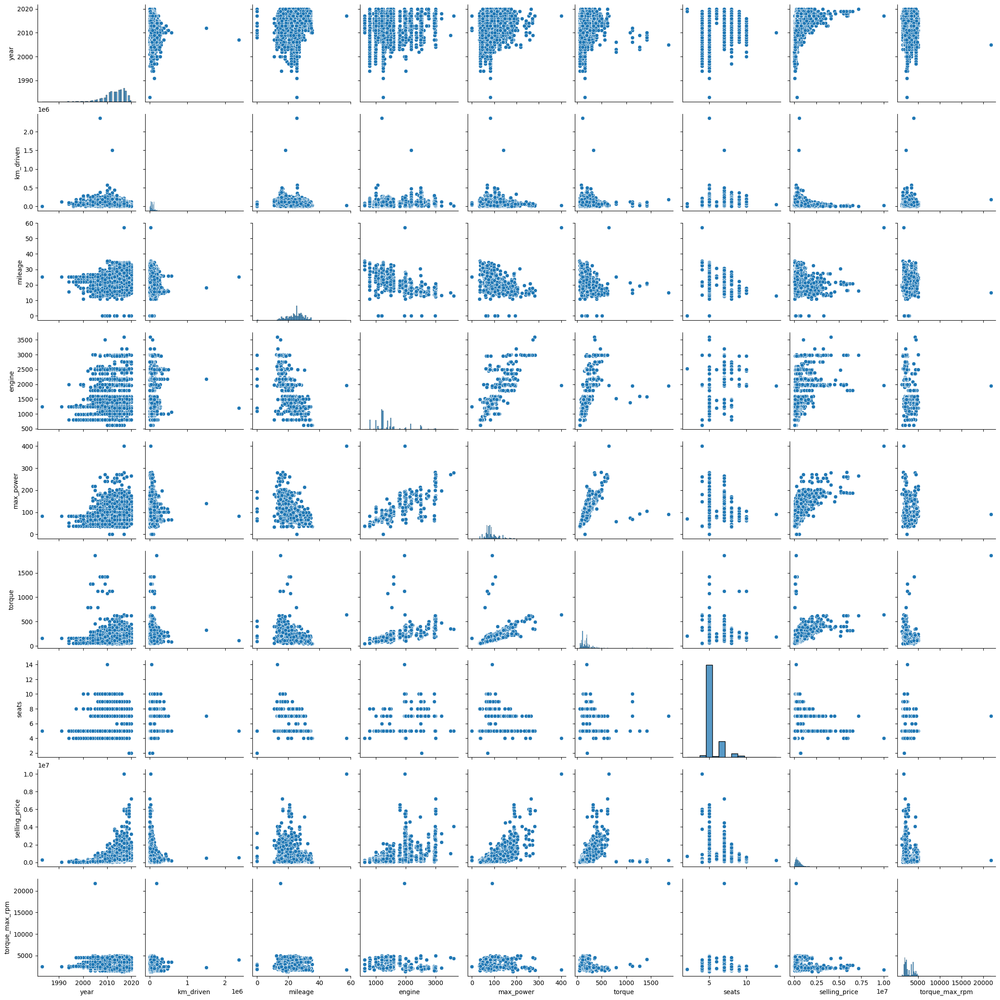

In [ ]:
sns.pairplot(df_train)

__Ответ: можно предположить, что есть некоторая положительная (но нелинейная) зависимость целевой переменной selling_price от year. Эту зависимость логично обосновать: чем новее машина, тем выше ее цена. Можно было бы предполагать отрицательную зависимость между selling_price и km_driven (меньше пробег - дороже авто), но на графике она не так отчетливо видна. Переменная selling_price также имеет положительную зависимость от технических характеристик авто, таких как engine, max_power, torque.__

 __Если анализировать взаимосвязь между самими признаками, стоит отменить явную положительную зависимость между engine, max_power, torque. Как было отмечено, все эти признаки относятся к техническим харакетристикам автомобиля (по сути, двигателя), поэто неудивительно, что изменение одного параметра (объем двигателя, мощность, крутящий момент) влечет такое же изменение другого. В стороне отстался параметр torque_max_rpm: по идее, этот параметр характеризует количество оборотов в минуту, на которых получено то или иное значение крутящего момента и мощности.__

 __Интуитивно понятной зависимости между year и km_driven "на глаз" не наблюдается. Требуется посмотреть корреляции более детально.__

 __Надо отметить, что распределение признаков не является нормальным.__

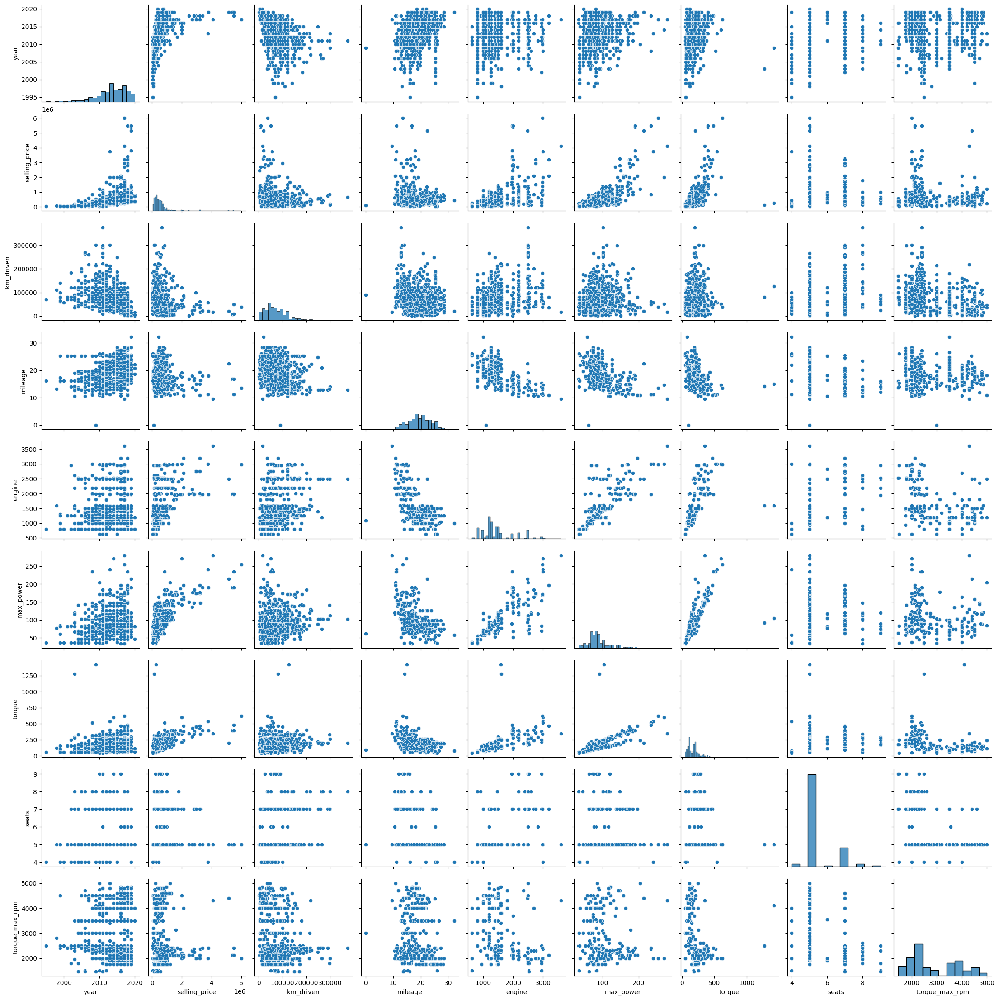

In [ ]:
sns.pairplot(df_test)

__Ответ: совокупности данных в трейне и тесте действительно оказались очень похожи.__

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [ ]:
df_train_corr = df_train.corr(numeric_only=True)
df_train_corr

,year,km_driven,mileage,engine,max_power,torque,seats,selling_price,torque_max_rpm
year,1.000000,-0.368966,0.325701,0.002819,0.156858,0.053285,0.041178,0.427279,0.033368
km_driven,-0.368966,1.000000,-0.253759,0.229766,0.024588,0.112932,0.192328,-0.164828,-0.230305
mileage,0.325701,-0.253759,1.000000,-0.693744,-0.441838,-0.365928,-0.525431,-0.160647,0.124882
engine,0.002819,0.229766,-0.693744,1.000000,0.681117,0.600193,0.652172,0.447672,-0.379705
max_power,0.156858,0.024588,-0.441838,0.681117,1.000000,0.660149,0.244112,0.692814,-0.150555
torque,0.053285,0.112932,-0.365928,0.600193,0.660149,1.000000,0.316331,0.466650,-0.365559
seats,0.041178,0.192328,-0.525431,0.652172,0.244112,0.316331,1.000000,0.149953,-0.292102
selling_price,0.427279,-0.164828,-0.160647,0.447672,0.692814,0.466650,0.149953,1.000000,-0.175175
torque_max_rpm,0.033368,-0.230305,0.124882,-0.379705,-0.150555,-0.365559,-0.292102,-0.175175,1.000000


In [ ]:
np.abs(df_train_corr).min()

,0
year,0.002819
km_driven,0.024588
mileage,0.124882
engine,0.002819
max_power,0.024588
torque,0.053285
seats,0.041178
selling_price,0.149953
torque_max_rpm,0.033368


In [ ]:
df_train_corr[df_train_corr >= 0.6]

,year,km_driven,mileage,engine,max_power,torque,seats,selling_price,torque_max_rpm
year,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
km_driven,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mileage,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
engine,NaN,NaN,NaN,1.000000,0.681117,0.600193,0.652172,NaN,NaN
max_power,NaN,NaN,NaN,0.681117,1.000000,0.660149,NaN,0.692814,NaN
torque,NaN,NaN,NaN,0.600193,0.660149,1.000000,NaN,NaN,NaN
seats,NaN,NaN,NaN,0.652172,NaN,NaN,1.000000,NaN,NaN
selling_price,NaN,NaN,NaN,NaN,0.692814,NaN,NaN,1.000000,NaN
torque_max_rpm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


<Axes: >

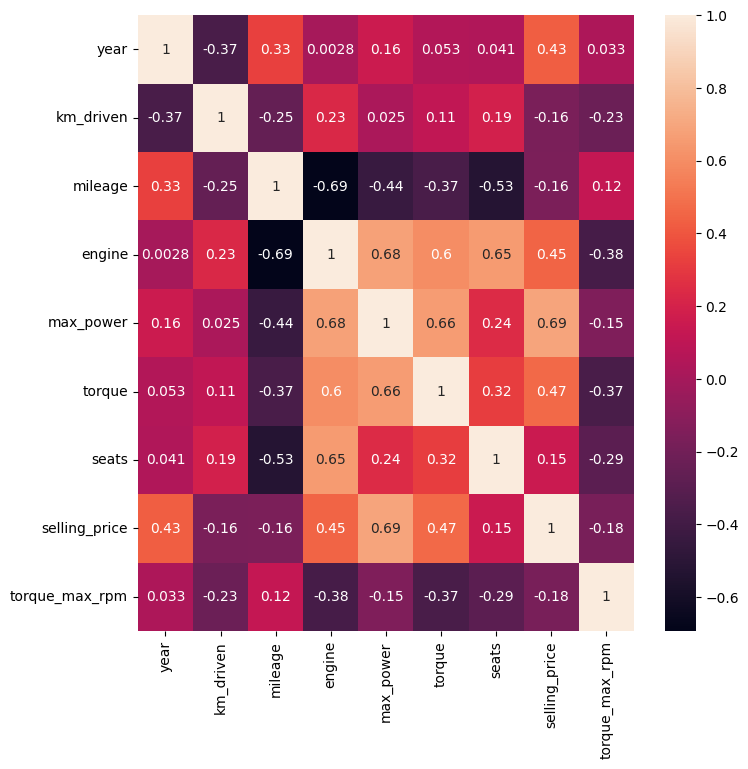

In [ ]:
plt.figure(figsize=(8, 8))
sns.heatmap(df_train_corr, annot=True)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Ответ: наименее скоррелированы между собой переменные year и engine (коэффициент корреляции около 0.003).`

`Сильная положительная линейная зависимость (0.6 и более) наблюдается между переменными engine, max_power, torque. Интересно, что зависимость также обнаружилась между engine и seats: видимо, в наборе данных есть крупные машины с закономерно увеличенным объемом двигателя и количеством мест. Наиболее яркая зависимость для целевой переменной selling_price (около 0.69) обнаружена для признака max_power.`

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [ ]:
def spearman_corr(feature1, feature2):
    ranked1 = feature1.argsort().argsort() + 1
    ranked2 = feature2.argsort().argsort() + 1
    d = (ranked1 - ranked2) ** 2
    return 1 - 6 * d.sum() / (len(d) * (len(d) ** 2 - 1))

<Axes: >

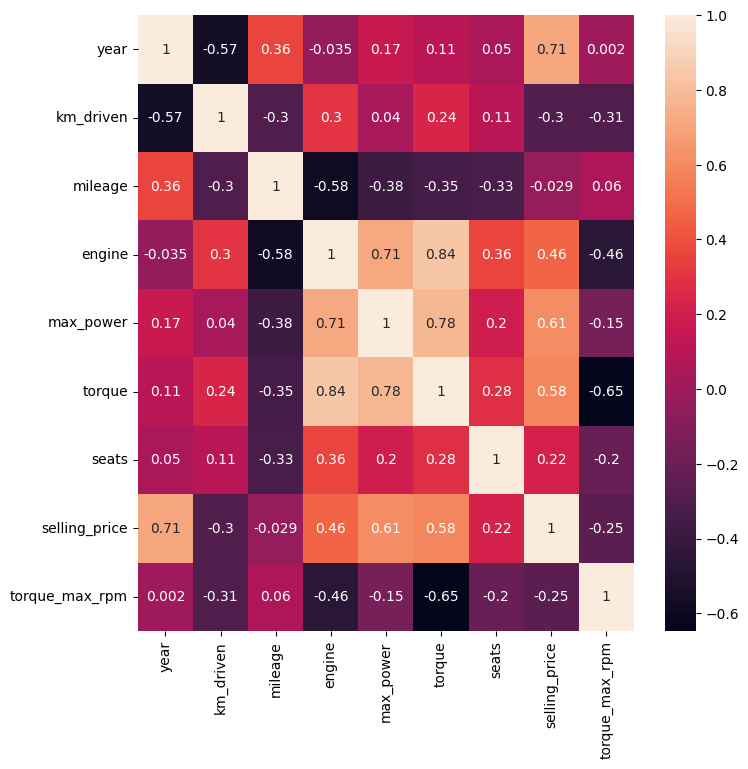

In [ ]:
for ind in df_train_corr.index:
    for col in df_train_corr.columns:
        df_train_corr.loc[ind, col] =  spearman_corr(df_train[ind], df_train[col])

plt.figure(figsize=(8, 8))
sns.heatmap(df_train_corr, annot=True)

<Axes: >

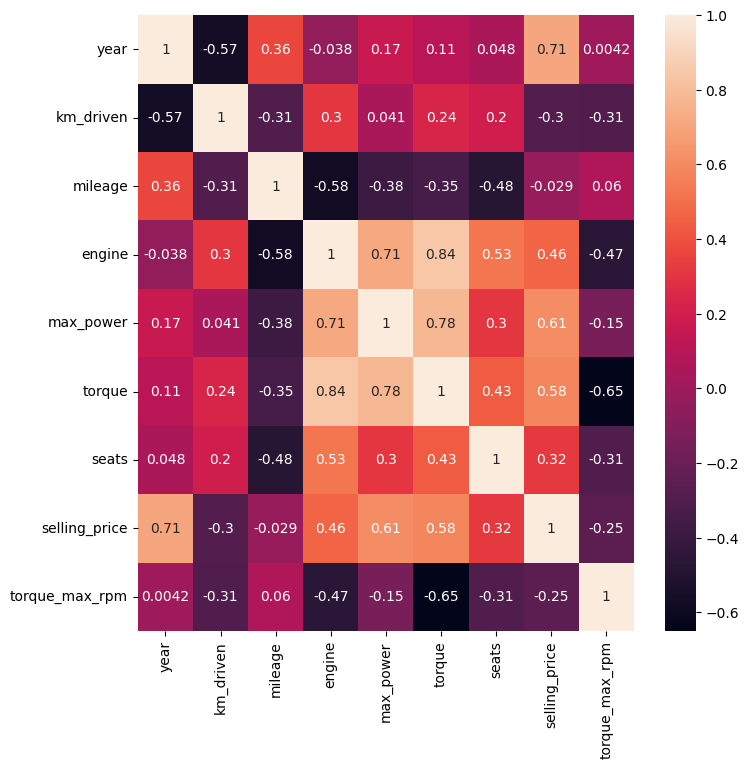

In [ ]:
plt.figure(figsize=(8, 8))
true_spearman_corr = df_train.corr(numeric_only=True, method='spearman')
sns.heatmap(true_spearman_corr, annot=True)

__Результаты для коэффициента Спирмена в целом похожи на результаты для коэффициента Пирсона. Для некоторых пар переменных (например, year и selling_price, torque и torque_max_rpm) можно заметить повышение абсолютной величины коэффицента, хотя для других пар (selling_price и max_power) значение индекса чуть уменьшилось. Однако в матрице все так же просматривается блок с повышенной корреляцией между техническими характеристиками автомобиля (для наглядности выделил этот блок на картинке).__

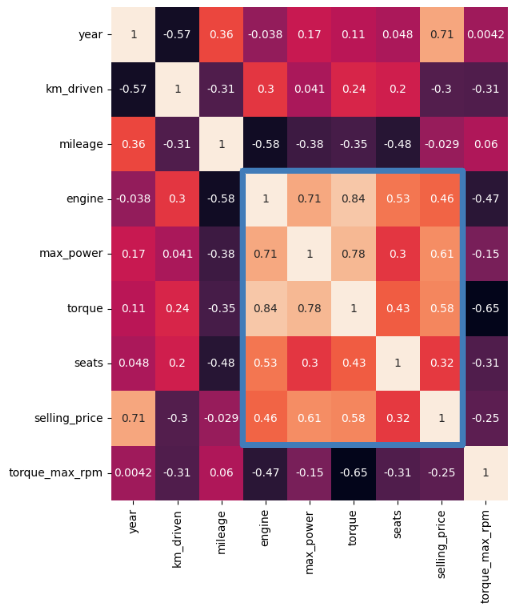

__Сравним собственную реализацию с библиотечной. Результаты запишем в виде матрицы:__

<Axes: >

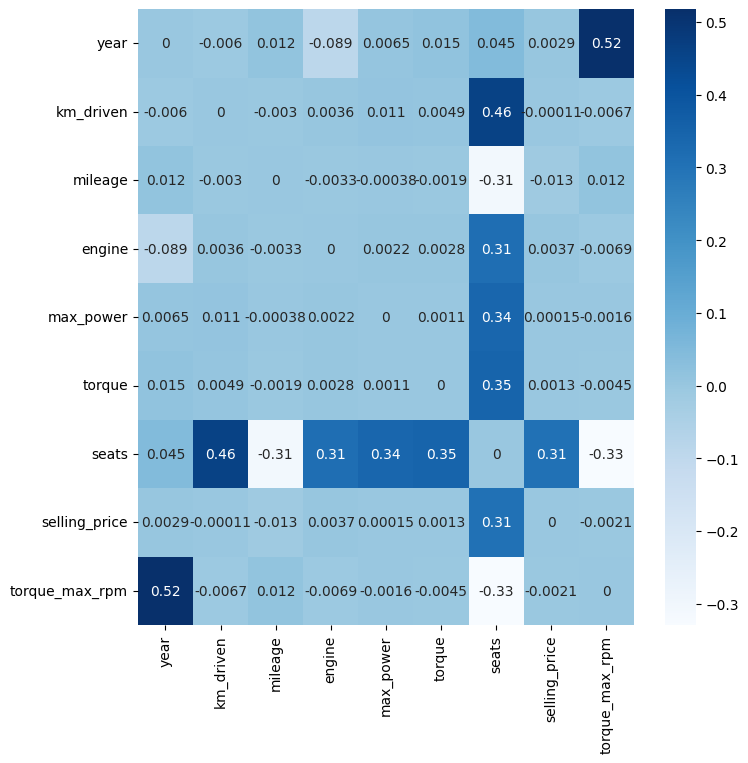

In [ ]:
plt.figure(figsize=(8, 8))
corr_mae = np.abs(df_train_corr - true_spearman_corr) / true_spearman_corr
sns.heatmap(corr_mae, annot=True, cmap='Blues')

__Видно, что ручной расчет в целом совпал с библиотечной реализацией, однако для некоторых значений ошибка доходит до 50 процентов.__

__Для расчета коэффициента корреляции Спримена критичным оказался выбор метода ранжирования, особенно с учетом того, что в датасете есть дубликаты. Наиболее близким к библиотечной реализации корреляций оказался подход, выполняющий ранжирование через argsort().argsort(): первым вызовом argsort() мы формируем массив перестановок индексов, вторым вызовом - выполняем собственно ранжирование.__

interval columns not set, guessing: ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'selling_price', 'torque_max_rpm']


<Axes: >

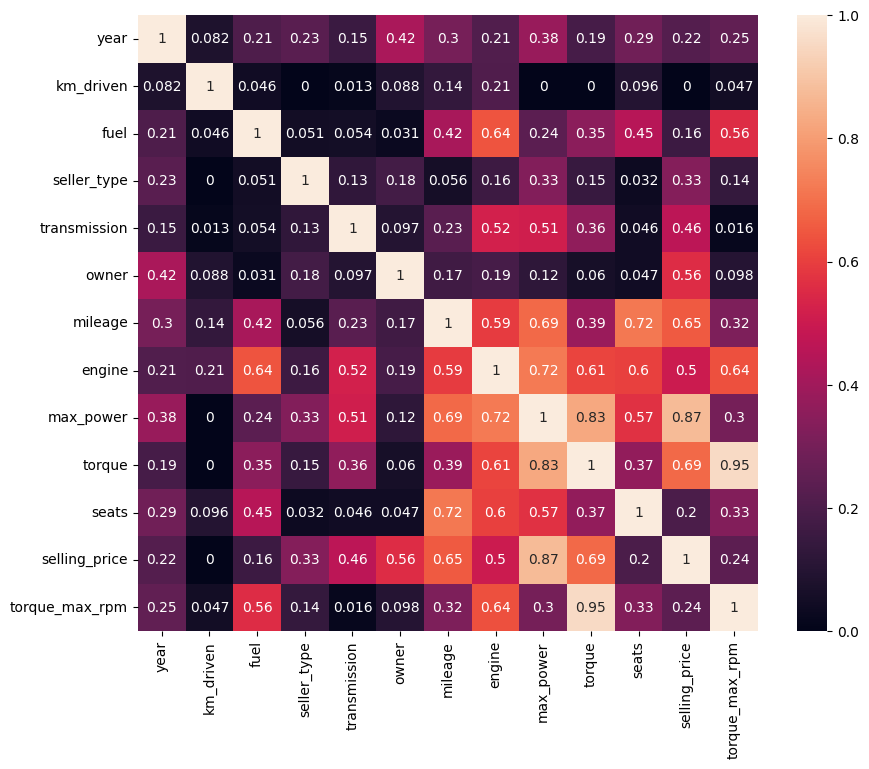

In [ ]:
import phik

plt.figure(figsize=(10, 8))
sns.heatmap(df_train.drop('name', axis=1).phik_matrix(), annot=True)

`Корреляция phik позволила обнаружить некоторую взаимосвязь для категориальных признаков: так, заметно повышенное значение phik для fuel и engine, fuel и torque_max_rpm: можно предположить, что характеристики двигателя зависит от типа топлива, но эта связь требует дополнительного анализа. Также между torque_max_rpm и torque оказалась высокая корреляция: видимо, крутящий момент зависит от количества оборотов в минуту зависит нелинейным образом. Все так же в матрице выделяется блок с повышенными корреляциями для технических характеристик автомобиля.`

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

__Посмотрим более детально взаимосвязь в наборе с учетом категориальных признаков.__

__Рассмотрим, как объем двигателя зависит от типа топлива:__

<Axes: title={'center': 'engine'}, xlabel='fuel'>

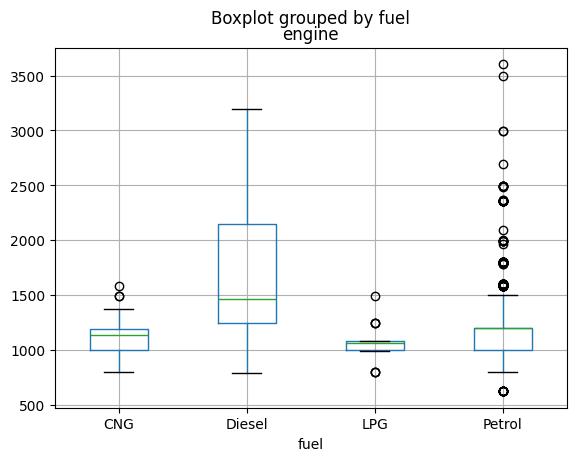

In [ ]:
df_train.boxplot(column='engine', by='fuel')

__Теперь посотрим боксплоты крутящего момента по видам топлива:__

<Axes: title={'center': 'torque'}, xlabel='fuel'>

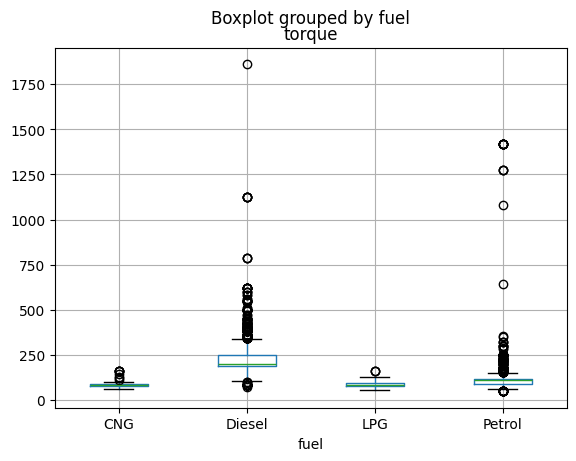

In [ ]:
df_train.boxplot(column='torque', by='fuel')

__Теперь посмотрим боксплоты оборотов в минуту по видам топлива:__

<Axes: title={'center': 'torque_max_rpm'}, xlabel='fuel'>

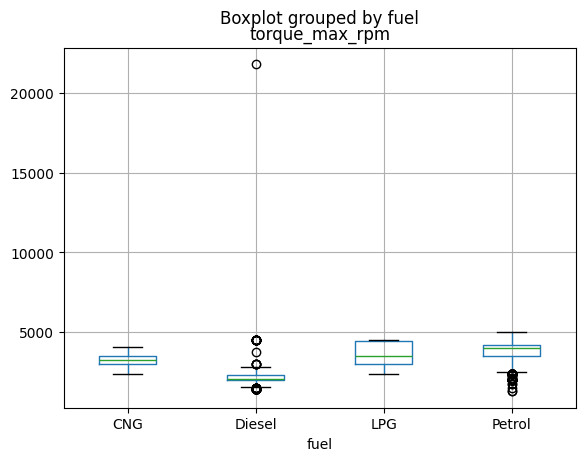

In [ ]:
df_train.boxplot(column='torque_max_rpm', by='fuel')

__По этим графикам становится действительно заметно различие двигателей по видам топлива, причем, если двигатели на бензине и газе в целом похожи между собой, дизельный двигатель выбивается из общего ряда.__

__Теперь посмотрим, как цена зависит от количества владельцев авто.__

<Axes: title={'center': 'selling_price'}, xlabel='owner'>

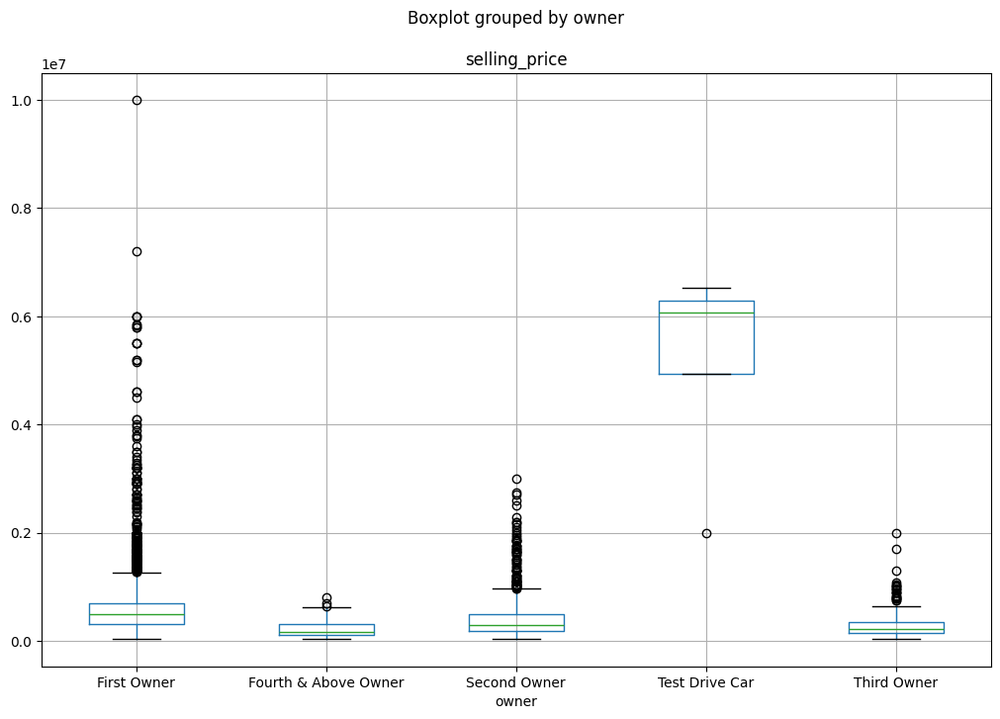

In [ ]:
df_train.boxplot(column="selling_price", by="owner", figsize=(12, 8))

__Посмотрим зависимость медианной цены от количества владельцев поближе:__

<BarContainer object of 5 artists>

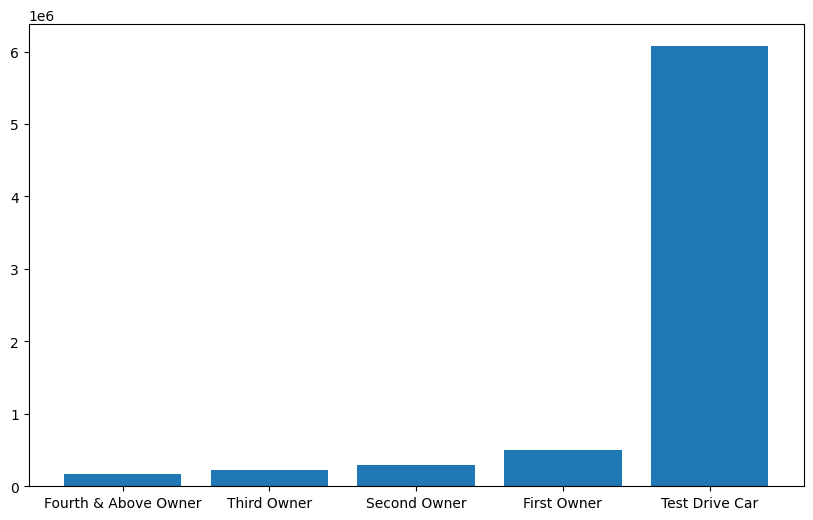

In [ ]:
plt.figure(figsize=(10, 6))
grouped = df_train.groupby('owner').agg({'selling_price': 'median'})
grouped = grouped.sort_values('selling_price')
plt.bar(grouped.index, grouped.selling_price)

__Видно, как наличие хотя бы одного владельца резко понижает стоимость автомобиля. При дальнейшем увеличении числа владельцев медиана все еще снижается, но в целом остается на одном уровне.__

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [ ]:
from sklearn.model_selection import train_test_split

cat_cols = df_train.select_dtypes(object).columns

y_train = df_train['selling_price']
X_train = df_train.drop(cat_cols, axis=1).drop('selling_price', axis=1)

In [ ]:
X_train.head()

,year,km_driven,mileage,engine,max_power,torque,seats,torque_max_rpm
0,2014,145500,28.363636,1248,74.00,190.00,5,2000.0
1,2014,120000,25.624242,1498,103.52,250.00,5,2000.0
2,2010,127000,27.878788,1396,90.00,219.52,5,2250.0
3,2007,120000,21.904762,1298,88.20,112.70,5,4500.0
4,2017,45000,27.401361,1197,81.86,113.75,5,4000.0


In [ ]:
assert X_train.shape == (5840, 8)

In [ ]:
y_test = df_test['selling_price']
X_test = df_test.drop(cat_cols, axis=1).drop('selling_price', axis=1)

In [ ]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()
lr.fit(X_train, y_train)
preds = lr.predict(X_test)
r2_score(y_test, preds), MSE(y_test, preds)

(0.598524987529937, 230779301543.09277)

__Ответ: значение $R^2$ составило 0.59: таким образом, модель частично объясняет дисперсию данных. Весьма велико значение $MSE$, хотя в таком виде его трудно интерпретировать: возьмем корень от $MSE$, чтобы найти ошибку по цене.__

In [ ]:
MSE(y_test, preds) ** 0.5

480394.9432946737

__Значение весьма велико, нельзя сказать, что модель обучилась до приемлемого уровня.__

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [ ]:
def my_r2(y_true, y_pred):
    SS_tot = ((y_true - y_true.mean()) ** 2).sum()
    SS_res = ((y_true - y_pred) ** 2).sum()
    return 1 - SS_res / SS_tot

In [ ]:
my_r2(y_test, preds)

0.598524987529937

`Ответ: формула R^2 приведена ниже:`

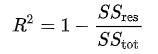

`В этой формуле S_res - сумма квадратов отклонений предсказаний от истинных значений (эта величина описывает "дисперсию" предсказаний), S_tot - сумма квадратов разностей истинных значений и их срднего (также называется общей суммой квадратов; эта величина описывает дисперсию истинных значений). R^2 характеризует долю дисперсии, объясняемую моделью`.

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
def adjusted_my_r2(X, y_true, y_pred):
    adj_coef = (len(y_true) - 1) / (len(y_true) - X.shape[1] - 1)
    return 1 - (1 - my_r2(y_true, y_pred)) * adj_coef

In [ ]:
adjusted_my_r2(X_test, y_test, preds)

0.5952840187108043

`Ответ: adjusted R^2 используется тогда, когда нам нужно найти компромисс между предсказательной способностью модели и ее сложностью (adjusted R^2 штрафует модель за слишком большое количество параметров).`

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
sc.fit(X_train)
X_train_sc = sc.transform(X_train)
X_test_sc = sc.transform(X_test)

In [ ]:
lr_sc = LinearRegression()
lr_sc.fit(X_train_sc, y_train)
preds = lr_sc.predict(X_test_sc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.5985249875299348, 230779301543.094)

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [ ]:
X_train.columns[np.abs(lr.coef_).argmax()]

'year'

__Ответ: наиболее информативным оказался признак year (надо отметить, что для этого признака было получено одно из самых высоких значений корреляции с selling_price).__

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(X_train_sc, y_train)
preds = lasso.predict(X_test_sc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.598524283472637, 230779706255.33365)

In [ ]:
lasso.coef_

array([160233.74611578, -50294.22481926,   4585.49788224,  24273.8715715 ,
       326796.17198571,   5887.89472566, -28987.80831417, -59184.48890171])

__Ответ: L1-регуляризация не занулила веса: вероятно, это связано с маленьким значением коэффициент регуляризации (alpha в Lasso).__



In [ ]:
lasso_big_alpha = Lasso(alpha=1e4)
lasso_big_alpha.fit(X_train_sc, y_train)
preds = lasso_big_alpha.predict(X_test_sc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.5862822911356846, 237816753028.52087)

In [ ]:
lasso_big_alpha.coef_

array([153749.83486685, -40382.28065298,      0.        ,      0.        ,
       330447.89628662,   1289.52521647,  -3688.83294708, -49071.94066583])

__Теперь видно, что некоторые веса занулились.__

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

__В param_grid заполняем параметр alpha - коэффициент регуляризации.__

In [ ]:
from sklearn.model_selection import GridSearchCV
import time

params = {'alpha' : [0.01, 0.1, 0.5, 1, 10, 100, 1000]}
grid_lasso = GridSearchCV(Lasso(), params, cv=10, scoring='r2')
start = time.time()
grid_lasso.fit(X_train_sc, y_train)
elapsed = time.time() - start

__Посмотрим на время обучения:__

In [ ]:
elapsed

0.40865659713745117

__А теперь на результаты обучения лучшей модели:__

In [ ]:
grid_lasso.best_score_, grid_lasso.best_estimator_, grid_lasso.best_params_

(0.5749551344052345, Lasso(alpha=1000), {'alpha': 1000})

__Таким образом, коэффициент регуляризации alpha = 1000.__

In [ ]:
preds = grid_lasso.predict(X_test_sc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.5977675933936579, 231214673320.4991)

In [ ]:
grid_lasso.best_estimator_.coef_

array([160218.84611298, -49180.60964936,   2027.23834625,  19109.61069802,
       327744.08126149,   5578.17085072, -26175.29907913, -58718.90687982])

__Видно, что веса не занулились.__

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

__В сетке параметров alpha - коэфифицент регуляризации, l1_ratio - коэффициент эластичности для L1-регуляризации.__

In [ ]:
from sklearn.linear_model import ElasticNet

params = {
    'alpha' : [0.01, 0.1, 0.5, 1, 10],
    'l1_ratio': [0.01, 0.1, 0.5, 0.999]
    }
grid_elastic = GridSearchCV(ElasticNet(), params, cv=10, scoring='r2')
start = time.time()
grid_elastic.fit(X_train_sc, y_train)
elapsed = time.time() - start

__Время обучения моделей:__

In [ ]:
elapsed

2.1709296703338623

__Гиперпараметры лучшей модели:__


In [ ]:
grid_elastic.best_score_, grid_elastic.best_estimator_, grid_elastic.best_params_

(0.5806030298441597,
 ElasticNet(alpha=0.1, l1_ratio=0.01),
 {'alpha': 0.1, 'l1_ratio': 0.01})

In [ ]:
preds = grid_elastic.predict(X_test_sc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.5759293501348242, 243767919150.65546)

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



__Реализуем L0-регуляризацию не в процессе обучения, а уже постфактум путем расчета информационного критерия Акаике с отбором признаков. Если верить тому скриншоту, что кидали в чат, так можно:__

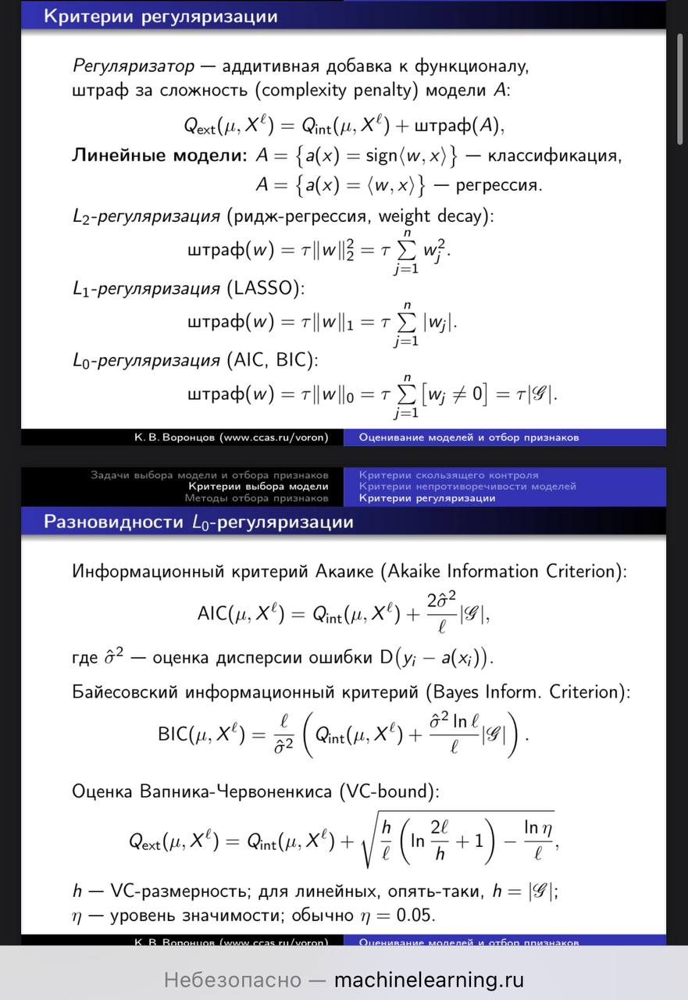

In [ ]:
from sklearn.base import BaseEstimator
from itertools import combinations

class AICRegressor(BaseEstimator):
    def __init__(self, alpha=1, l1_ratio=1, model_name='lasso'):
        super().__init__()
        self.alpha = alpha
        self.l1_ratio = l1_ratio
        self.feature_subset = None
        self.best_aic_model = None
        self.scaler = None
        self.model_name = model_name

    def calculate_aic(self, model, X, y):
        n, k = X.shape[0], X.shape[1]
        y_pred = model.predict(X)
        residual_sum_of_squares = np.sum((y - y_pred) ** 2)
        mse = MSE(y, y_pred, multioutput='uniform_average')
        log_likelihood = -n * 1 / 2 * (np.log(2 * np.pi * mse) + 1)
        total_params = 1 * (k + 1)
        aic = 2 * total_params - 2 * log_likelihood
        return aic

    def fit(self, X, y):
        min_aic = float('inf')
        for num_features in range(1, X.shape[1] + 1):
            for feature_subset in combinations(X.columns, num_features):
                scaler = StandardScaler()
                scaler.fit(X[list(feature_subset)])
                X_subset = scaler.transform(X[list(feature_subset)])
                y_subset = y.values
                if self.model_name == 'lasso':
                    model = Lasso(alpha=self.alpha)
                else:
                    model = ElasticNet(alpha=self.alpha, l1_ratio=self.l1_ratio)
                model.fit(X_subset, y_subset)
                aic = self.calculate_aic(model, X_subset, y_subset)
                if aic < min_aic:
                    min_aic = aic
                    self.best_aic_model = model
                    self.feature_subset = feature_subset
                    self.scaler = scaler
        return self

    def predict(self, X):
        scaled = self.scaler.transform(X[list(self.feature_subset)])
        return self.best_aic_model.predict(scaled)

In [ ]:
params = {
    'alpha': [0.1, 0.5, 1, 10, 100, 1000],
    'l1_ratio': [0.1, 0.5, 0.9],
    'model_name': ['lasso', 'elastic']
}
grid_aic = GridSearchCV(AICRegressor(), params, cv=10, scoring='r2')
# обучается долго
grid_aic.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=AICRegressor(),
             param_grid={'alpha': [0.1, 0.5, 1, 10, 100, 1000],
                         'l1_ratio': [0.1, 0.5, 0.9],
                         'model_name': ['lasso', 'elastic']},
             scoring='r2')

In [ ]:
grid_aic.best_score_, grid_aic.best_estimator_, grid_aic.best_params_

(0.5792558328723678,
 AICRegressor(l1_ratio=0.9, model_name='elastic'),
 {'alpha': 1, 'l1_ratio': 0.9, 'model_name': 'elastic'})

In [ ]:
preds = grid_aic.predict(X_test)
r2_score(y_test, preds), MSE(y_test, preds)

(0.5740890241457848, 244825791080.8389)

In [ ]:
grid_aic.best_estimator_.feature_subset

('year', 'km_driven', 'max_power', 'seats', 'torque_max_rpm')

__Ответ: таким образом, у нас не получилось повысить качество модели, но мы избавились от некоторых признаков.__

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

__Максимально сократим количество категорий, оставив только марку авто (первое слово в полном названии).__

In [ ]:
X_train_cat = df_train.drop('selling_price', axis=1)
X_train_cat['name'] = X_train_cat['name'].apply(lambda x: x.split()[0])

In [ ]:
X_test_cat = df_test.drop('selling_price', axis=1)
X_test_cat['name'] = X_test_cat['name'].apply(lambda x: x.split()[0])

In [ ]:
X_train_cat.shape == (5840, 13)

True

In [ ]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

cat_cols = X_train_cat.select_dtypes(object).columns
num_cols = X_train_cat.select_dtypes(np.number).columns

col_trans = ColumnTransformer(
    [
        ("scaler", StandardScaler(), num_cols),
        ("ohe", OneHotEncoder(drop='first', handle_unknown='ignore'), cat_cols),
    ])

col_trans.fit(X_train_cat)
X_train_preproc = col_trans.transform(X_train_cat)
X_test_preproc = col_trans.transform(X_test_cat)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`OHE целесообразно использовать в случае относительно небольшого числа категорий, иначе мы получим избыточное количество признаков, что негативно скажется на обучении.`

`В случае OHE преобразования мы получаем линейно-зависимые столбцы, поэтому, для избежания линейности, лучше удалять один столбец.`

`Если какие-то k столбцов после OHE преобразования оказались неважными по весам, лучше их оставить, иначе мы не сможем правильно закодировать соответствующие k категорий (они будут кодироваться одними и теми же нулями), что может привести к ошибке.`

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
from sklearn.linear_model import Ridge

params = {
    'alpha' : [1e-3, 0.01, 0.1, 0.5, 1, 10, 100, 1000],
    }
grid_ridge = GridSearchCV(Ridge(), params, cv=10, scoring='r2')
grid_ridge.fit(X_train_preproc, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 0.5, 1, 10, 100, 1000]},
             scoring='r2')

In [ ]:
grid_ridge.best_score_, grid_ridge.best_estimator_, grid_ridge.best_params_

(0.6999447965696384, Ridge(alpha=1), {'alpha': 1})

In [ ]:
preds = grid_ridge.predict(X_test_preproc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.78001219348599, 126455273076.51787)

__Ответ: качество прогнозов удалось значительно улучшить (метрика $R^2$ выросла на 0.2, $MSE$ уменьшилась практически вдвое).__

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

__Попробуем добавить в данные признаки на основе существующих. Вначале проследуем по инструкции: возведем год в квадрат (а вместе с ним и признак km_driven) и поделим лошадиные силы на объем двигателя.__

In [ ]:
X_train_cat['year_squared'] = X_train_cat['year'] ** 2
X_train_cat['km_driven_squared'] = X_train_cat['km_driven'] ** 2
X_train_cat['bhp_per_cc'] = X_train_cat['max_power'] / X_train_cat['engine']
X_test_cat['year_squared'] = X_test_cat['year'] ** 2
X_test_cat['km_driven_squared'] = X_test_cat['km_driven'] ** 2
X_test_cat['bhp_per_cc'] = X_test_cat['max_power'] / X_test_cat['engine']

cat_cols = X_train_cat.select_dtypes(object).columns
num_cols = X_train_cat.select_dtypes(np.number).columns

col_trans = ColumnTransformer(
    [
        ("scaler", StandardScaler(), num_cols),
        ("ohe", OneHotEncoder(drop='first', handle_unknown='ignore'), cat_cols),
    ])

col_trans.fit(X_train_cat)
X_train_preproc = col_trans.transform(X_train_cat)
X_test_preproc = col_trans.transform(X_test_cat)

grid_ridge_2 = GridSearchCV(Ridge(), params, cv=10, scoring='r2')
grid_ridge_2.fit(X_train_preproc, y_train)
preds = grid_ridge_2.predict(X_test_preproc)
r2_score(y_test, preds), MSE(y_test, preds)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


(0.7947349234746593, 117992227462.07632)

__Во время визуализации данных было выявлено, что цена автомобиля сильно оличается для новых авто и авто, имеющих владельца, причем с увеличением числа владельцев цена меняется несильно. Добавим бинарный признак is_new, который будет информировать о том, является ли машина новой или имеет владельца.__

In [ ]:
X_train_cat['is_new'] = (X_train_cat['owner'] == 'Test Drive Car').astype(int)
X_test_cat['is_new'] = (X_train_cat['owner'] == 'Test Drive Car').astype(int)

cat_cols = X_train_cat.select_dtypes(object).columns
num_cols = X_train_cat.select_dtypes(np.number).columns

col_trans = ColumnTransformer(
    [
        ("scaler", StandardScaler(), num_cols),
        ("ohe", OneHotEncoder(drop='first', handle_unknown='ignore'), cat_cols),
    ])

col_trans.fit(X_train_cat)
X_train_preproc = col_trans.transform(X_train_cat)
X_test_preproc = col_trans.transform(X_test_cat)

params = {
    'alpha' : [1e-3, 0.01, 0.1, 0.5, 1, 10, 100, 1000],
    }

grid_ridge_3 = GridSearchCV(Ridge(), params, cv=10, scoring='r2')
grid_ridge_3.fit(X_train_preproc, y_train)
preds = grid_ridge_3.predict(X_test_preproc)
r2_score(y_test, preds), MSE(y_test, preds)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


(0.8077053104925805, 110536478626.49304)

__Посмотрим обычную линейную регрессию.__

In [ ]:
lr = LinearRegression()
lr.fit(X_train_preproc, y_train)
preds = lr.predict(X_test_preproc)
r2_score(y_test, preds), MSE(y_test, preds)

(0.8082458434781858, 110225764831.10266)

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    err = np.abs(y_true - y_pred) / y_true
    return (err <= 0.1).sum() / len(err)

models = {
    'ridge': grid_ridge_3,
    'lin_reg': lr,
    }

for name, model in models.items():
    preds = model.predict(X_test_preproc)
    print(f'model: {name}, metric value = {business_metrics(y_test, preds)}')

model: ridge, metric value = 0.273
model: lin_reg, metric value = 0.275


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



__Ответ: для штрафования недопрогноза можно воспользоваться чем-то аналогичным метрике SMAPE. Будем рассчитывать среднюю относительную ошибку прогноза (в процентах) со штрафованием недопрогнозов:__

$$metric = \frac{100\%}{n}\sum_{i=1}^{n}\frac{|pred_{i} - y_{i}|}{y_{i} + |pred_{i}|},$$

__где $pred_{i}$ - i-й прогноз, $y_i$ - истинное значение цена для i-го автомобиля, $n$ - размер выборки. Модуль в знаменателе нужен на случай отрицательного значения предсказания (так как истинная цена всегда положительна).__

__Убедимся, что эта метрика действительно штрафует недопрогноз. Например, при y = 5, pred = 3:__

$$metric = 100\% \times \sum_{i=1}^{n}\frac{|3 - 5|}{5 + |3|}= 25 \%,$$

__а при y = 5, pred = 7:__

$$metric = 100\% \times \sum_{i=1}^{n}\frac{|7 - 5|}{5 + |7|}= 17 \%.$$

In [ ]:
def your_business_metrics(y_true, y_pred):
    return 100 * (np.abs(y_pred - y_true) / (np.abs(y_pred) + y_true)).mean()

for name, model in models.items():
    preds = model.predict(X_test_preproc)
    print(f'model: {name}, metric value = {your_business_metrics(y_test, preds)}')

model: ridge, metric value = 19.10025431834618
model: lin_reg, metric value = 19.42291592648805


__Таким образом, обычная линейная регрессия оказалась чуть лучше с точуи зрения "бизнеса".__

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

__Объединим все в пайплан и сохраним в формате .pickle:__

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer

def remove_units_in_df(df):
    df_copy = df.copy()
    for col in ['mileage', 'engine', 'max_power']:
        df_copy[col] = df_copy[col].apply(remove_units)
    return df_copy

def parse_torque_in_df(df):
    df_copy = df.copy()
    parsed_torque = df['torque'].apply(parse_torque)
    df_copy['torque'] = parsed_torque.apply(get_nm)
    df_copy['torque_max_rpm'] = parsed_torque.apply(get_rpm)
    return df_copy

def change_types(df):
    df_copy = df.copy()
    df_copy['engine'] = df_copy['engine'].astype(int)
    df_copy['seats'] = df_copy['seats'].astype(int)
    return df_copy

def append_columns(df):
    df_copy = df.copy()
    df_copy['year_squared'] = df_copy['year'] ** 2
    df_copy['km_driven_squared'] = df_copy['km_driven'] ** 2
    df_copy['bhp_per_cc'] = df_copy['max_power'] / df_copy['engine']
    df_copy['is_new'] = df_copy['owner'] == 'Test Drive Car'
    return df_copy

table_editor = Pipeline(steps=[
    ('units_remover', FunctionTransformer(remove_units_in_df)),
    ('torque_parser', FunctionTransformer(parse_torque_in_df)),
    ('columns_appender', FunctionTransformer(append_columns)),
])

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
    ])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='NA')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_cols),
        ('cat', categorical_transformer, cat_cols)
    ])

pipeline = Pipeline(steps=[
        ('table_editor', table_editor),
        ('preprocessor', preprocessor),
        ('regressor', LinearRegression())
    ])

df_train_nan = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test_nan = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')
X_train_nan = df_train_nan.drop('selling_price', axis=1)
y_train_nan = df_train_nan['selling_price']
pipeline.fit(X_train_nan, y_train_nan)

Pipeline(steps=[('table_editor',
                 Pipeline(steps=[('units_remover',
                                  FunctionTransformer(func=<function remove_units_in_df at 0x7c3488538280>)),
                                 ('torque_parser',
                                  FunctionTransformer(func=<function parse_torque_in_df at 0x7c3488539ab0>)),
                                 ('columns_appender',
                                  FunctionTransformer(func=<function append_columns at 0x7c34885cfac0>))])),
                ('preprocessor',
                 ColumnTransformer...
       'seats', 'torque_max_rpm', 'year_squared', 'km_driven_squared',
       'bhp_per_cc', 'is_new'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='NA',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['name', 'fuel', 'seller_type', 'transmission', 'owner'], dtype='object'))])),
                ('regressor', LinearRegression())])

In [ ]:
X_test_nan = df_test_nan.drop('selling_price', axis=1)
y_test_nan = df_test_nan['selling_price']
preds = pipeline.predict(X_test_nan)
r2_score(y_test, preds), MSE(y_test, preds)

(0.9255982209532136, 42768267186.39489)

In [ ]:
import pickle

with open('best_model.pkl', 'wb') as file:
    pickle.dump(pipeline, file)

In [ ]:
with open('best_model.pkl', 'rb') as f:
    model = pickle.load(f)
preds = model.predict(X_test_nan)
r2_score(y_test, preds), MSE(y_test, preds)

(0.9255982209532136, 42768267186.39489)

__Возьмем корень и посмотрим ошибку по цене:__

In [ ]:
MSE(y_test, preds) ** 0.5

206804.90126298962

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>